[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/guiwitz/DLImaging/blob/master/notebooks/01-Basics_image_processing.ipynb)

# 1. Basics of image handling and processing

In order to deploy Machine Learning approaches for images, we of course need to know how to handle images in Python. In particular complex pipelines may require some pre-processing, and we will introduce here some basic concepts.

Different fields favor different image handling packages. Fields working with "natural" images favor Pillow (PIL) which is also used as a backend in PyTorch, scientific fields like microscopy favor scikit-image, and computer vision prefers OpenCV. We will therefore present here basics for several packages and you will have to choose the most appropriate once for your projects.

In [1]:
# set path containing data folder or use default for Colab (/gdrive/My Drive)
local_folder = "../"
import urllib.request
urllib.request.urlretrieve('https://raw.githubusercontent.com/guiwitz/DLImaging/master/utils/check_colab.py', 'check_colab.py')
from check_colab import set_datapath
colab, datapath = set_datapath(local_folder)

## Pillow

Pillow provides basic image processing capabilities in particular in the context of "natural" images like photographs. In particular it interfaces nicely with interactive computing tools like Jupyter by simply displaying image variables as images. The syntax of PIL is very object oriented and slightly unusual. Let's import the main module of the package:

In [2]:
from PIL import Image
import matplotlib.pyplot as plt

Now we can open an image (standard formats like jpg or tiff are handled). The result is a PIL image object which comes with a series of methods attached. Also one can easily display it without additional coding:

In [3]:
image = Image.open(datapath.joinpath('data/woody_bulle.JPG'))

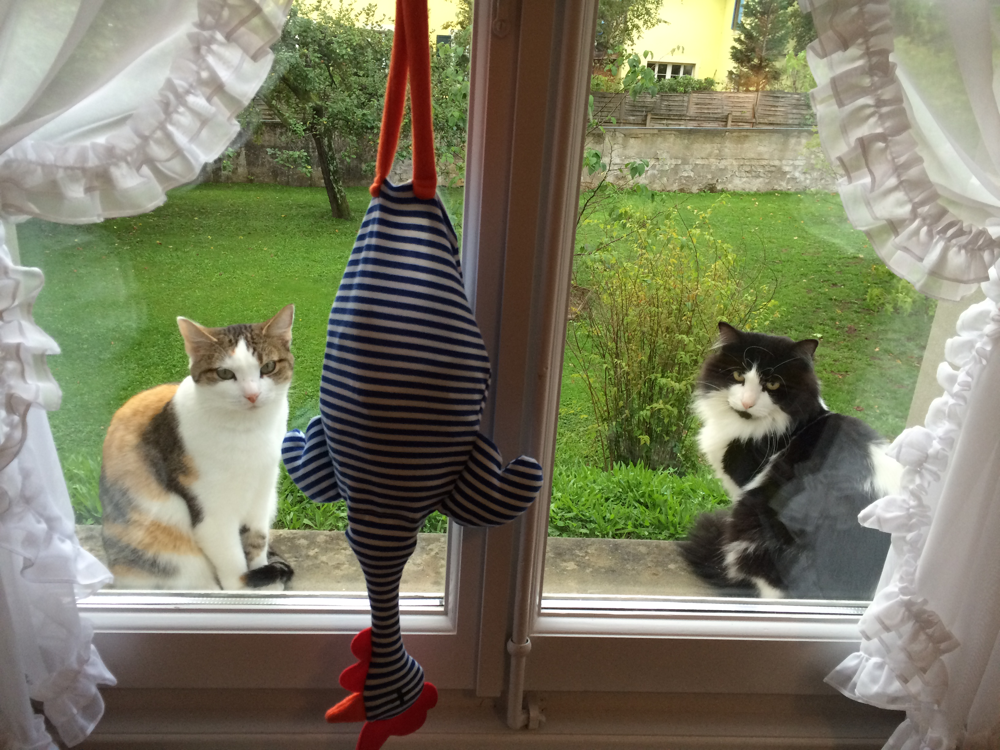

In [4]:
image

However, the PIL format is also compatible with Matplotlib, so if you need more complex plots (e.g. grids or superposition with other data), you can simply use the PIL image as a Numpy array:

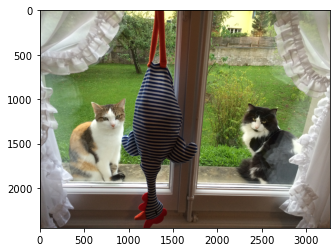

In [5]:
plt.imshow(image)

### Adjusting size, orientation etc.
Many functions are then directly accessible as methods of the ```image``` object. A few examples here:
- Transposing
- Cropping
- Resizing
- Rotate

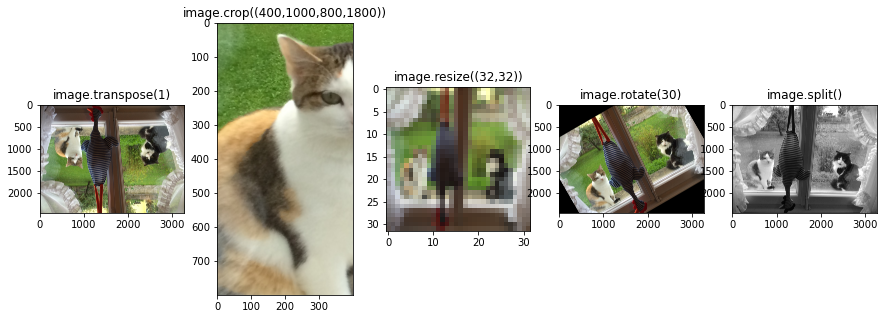

In [6]:
fig, ax = plt.subplots(1,5, figsize=(15,5))

ax[0].imshow(image.transpose(1))
ax[0].set_title('image.transpose(1)')
ax[1].imshow(image.crop((400,1000,800,1800)))
ax[1].set_title('image.crop((400,1000,800,1800))')
ax[2].imshow(image.resize((32,32)))
ax[2].set_title('image.resize((32,32))')
ax[3].imshow(image.rotate(30))
ax[3].set_title('image.rotate(30)')
r, g, b = image.split()
ax[4].imshow(g, cmap = 'gray')
ax[4].set_title('image.split()');

### Adjusting colors
Using the ```ImageEnhance``` module, you can also control typical image features like contrast, brightness etc. 

In [7]:
from PIL import ImageEnhance

In [8]:
enh = ImageEnhance.Brightness(image)
contr = ImageEnhance.Contrast(image)

In [9]:
enhanced = enh.enhance(1.3)
contrasted = contr.enhance(0.5)

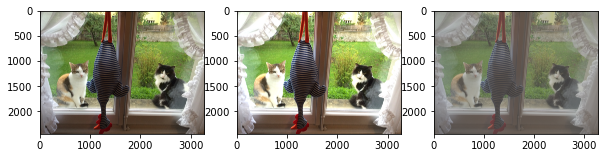

In [10]:
fig, ax = plt.subplots(1,3, figsize=(10,19))
ax[0].imshow(image)
ax[1].imshow(enhanced)
ax[2].imshow(contrasted);

### Filtering

Finally, PIL also offers some basic filtering capabilities. A very common example is Gaussian filtering (we will come back to filtering in a later notebook).

In [11]:
from PIL import ImageFilter

In [12]:
gauss_filter = ImageFilter.GaussianBlur(radius=20)

image_gauss = image.filter(gauss_filter)

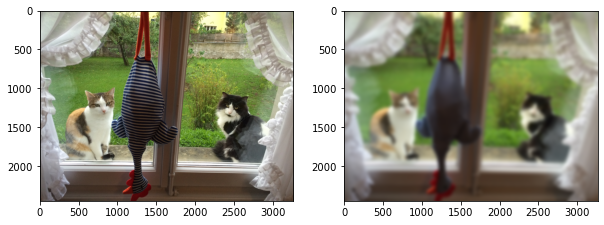

In [13]:
fig, ax = plt.subplots(1,2, figsize=(10,19))
ax[0].imshow(image)
ax[1].imshow(image_gauss);

### Saving images

You can easily save jpg images with:

In [15]:
image_gauss.save(datapath.joinpath('output/image_gauss.jpg'))

## scikit-image

scikit-image is widely used in the scientific area and in particular for microscopy. It implements a very wide choice of image processing algorithms and is very user friendly with a simple and consistent functional approach mostly following the pattern ```processed_image = f(image, option1, option2)```. We show here only a few essential tools that might be useful for pre- and post-processing.

### Importing images

Images of various formats can simply be imported with the ```skimage.io``` module as N-dimensional Numpy arrays:

In [16]:
import skimage

In [17]:
image = skimage.io.imread(datapath.joinpath('data/woody_bulle.JPG'))

In [18]:
print(f'format: {type(image)}')
print(f'shape: {image.shape}')

format: <class 'numpy.ndarray'>
shape: (2448, 3264, 3)


We see here that our RGB jpg image is just a 3D Numpy array, with each plane representing one color:

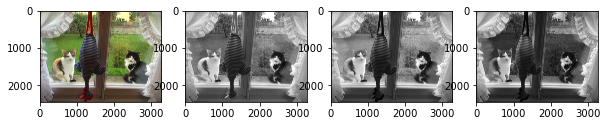

In [19]:
fig, ax = plt.subplots(1,4,figsize=(10,10))
ax[0].imshow(image)
ax[1].imshow(image[:,:,0], cmap='gray')
ax[2].imshow(image[:,:,1], cmap='gray')
ax[3].imshow(image[:,:,2], cmap='gray');

### Adjusting size, orientation

Like with PIL, we have many possibilities to modify the shape, size etc of images. Those functions are here not directly attached to images (which are just Numpy arrays) but belong to specialized modules like ```skimage.transform```:

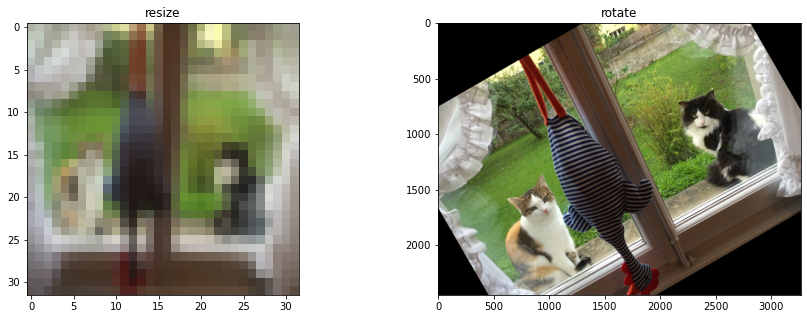

In [20]:
fig, ax = plt.subplots(1,2, figsize=(15,5))

ax[0].imshow(skimage.transform.resize(image, (32,32)))
ax[0].set_title('resize')
ax[1].imshow(skimage.transform.rotate(image,30))
ax[1].set_title('rotate');

### Adjust colors

scikit-image also has several function to adjust the image colors in the ```color``` module. For example one can turn a color image to gray scale:

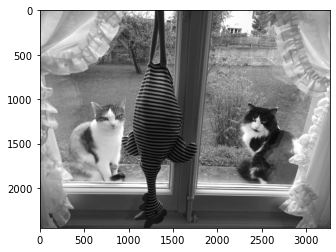

In [21]:
plt.imshow(skimage.color.rgb2gray(image), cmap='gray');

And many other functions are available from the ```exposure``` module. For example gamma correction:

In [22]:
image_gamma = skimage.exposure.adjust_gamma(image,0.5)

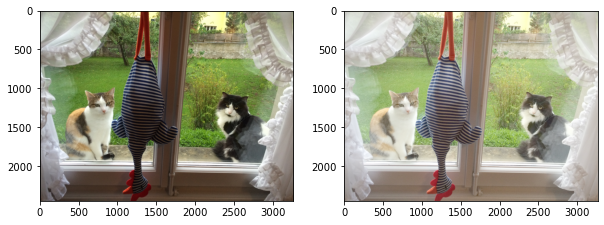

In [23]:
fig, ax = plt.subplots(1,2, figsize=(10,19))
ax[0].imshow(image)
ax[1].imshow(image_gamma);

### Changing types

To feed a neural network, one often has to change the image type e.g. to float type. scikit-image offers a series of functions to facilitate this. For example:

In [24]:
image_float = skimage.img_as_float32(image)
image_float.dtype

dtype('float32')

#### Filtering

Finally, scikit-image offers a very wide choice of filters for smoothing, denoising, edge detection etc. Most can be found in the ```filters``` module. The latter also contains a series of thresholding methods that can be useful to produce masks.

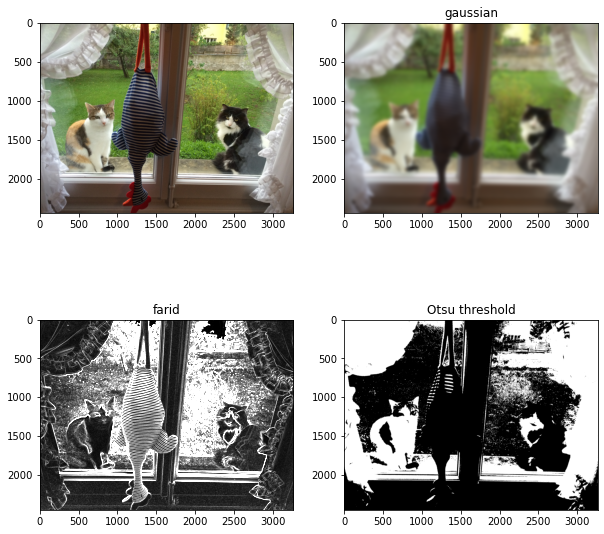

In [25]:
fig, ax = plt.subplots(2,2, figsize=(10,10))
ax[0,0].imshow(image)
ax[0,1].imshow(skimage.filters.gaussian(image, sigma=20, channel_axis=2))
ax[0,1].set_title('gaussian')
ax[1,0].imshow(skimage.filters.farid(image[:,:,0]), cmap='gray', vmin=0, vmax=0.02)
ax[1,0].set_title('farid')
threshold = skimage.filters.threshold_otsu(image[:,:,0])
ax[1,1].imshow(image[:,:,0] > threshold, cmap='gray')
ax[1,1].set_title('Otsu threshold');

### Saving images

You can easily save images here as well using the ```skimage.io``` module. You can save multiple image types in various formats, but you might have to be careful about compatibilities. For example you might get warnings when trying to save float images as jpg.

In [26]:
image_gauss2 = skimage.filters.gaussian(image, sigma=2, channel_axis=2)

In [27]:
skimage.io.imsave(datapath.joinpath('output/image_gauss2.jpg'), image_gauss2)

Lossy conversion from float64 to uint8. Range [0.005362774621907231, 1.0000000000000002]. Convert image to uint8 prior to saving to suppress this warning.
